In [ ]:
# Step 1: Install and Import Required Libraries
!pip install -q torchvision matplotlib

import os
import time
import zipfile
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

from google.colab import files
uploaded = files.upload()  # Upload 'bacterial.zip'
!unzip -o "*.zip" -d ./bacterial_dataset/

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 78.6 MB/s eta 0:00:00


Saving bacterial.zip to bacterial.zip
Archive:  bacterial.zip
   creating: ./bacterial_dataset/Tomato_Bacterial_spot/
  inflating: ./bacterial_dataset/Tomato_Bacterial_spot/00416648-be6e-4bd4-bc8d-82f43f8a7240___GCREC_Bact.Sp 3110.JPG  
  inflating: ./bacterial_dataset/Tomato_Bacterial_spot/0045ba29-ed1b-43b4-afde-719cc7adefdb___GCREC_Bact.Sp 6254.JPG  
  inflating: ./bacterial_dataset/Tomato_Bacterial_spot/00639d29-2d1a-4fcf-9bd3-a2b3109c74c4___UF.GRC_BS_Lab Leaf 1054.JPG  
  inflating: ./bacterial_dataset/Tomato_Bacterial_spot/00728f4d-83a0-49f1-87f8-374646fcda05___GCREC_Bact.Sp 6326.JPG  
  inflating: ./bacterial_dataset/Tomato_Bacterial_spot/00a7c269-3476-4d25-b744-44d6353cd921___GCREC_Bact.Sp 5807.JPG  
  inflating: ./bacterial_dataset/Tomato_Bacterial_spot/00b7e89a-e129-4576-b51f-48923888bff9___GCREC_Bact.Sp 6202.JPG  
  inflating: ./bacterial_dataset/Tomato_Bacterial_spot/01375198-62af-4c40-bddf-f3c11107200b___GCREC_Bact.Sp 5914.JPG  
  inflating: ./bacterial_dataset/Tomato_Bact

In [ ]:
# Step 2: Image Preprocessing
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])

# Step 3: Custom Dataset
class BacterialDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.transform = transform
        self.image_paths = []
        valid_exts = ('.jpg', '.jpeg', '.png', '.bmp')
        for root, _, files in os.walk(image_dir):
            for file in files:
                if file.lower().endswith(valid_exts):
                    self.image_paths.append(os.path.join(root, file))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image


✅ Total bacterial images found: 2127


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


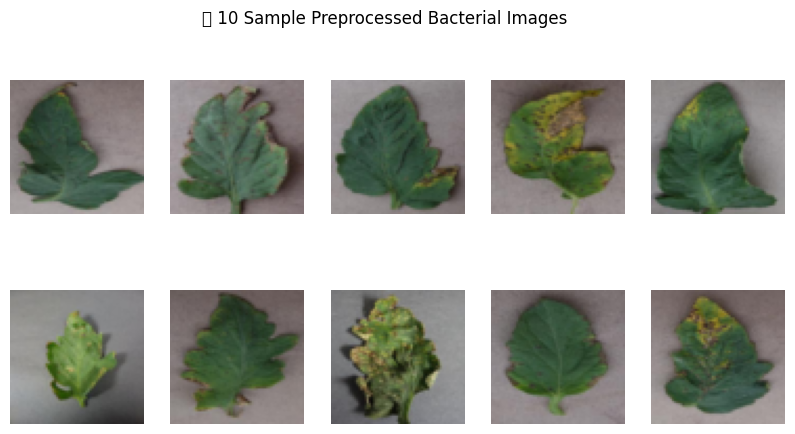

In [ ]:
# Step 4: Load Dataset
image_dir = './bacterial_dataset/'
dataset = BacterialDataset(image_dir, transform)
print(f"✅ Total bacterial images found: {len(dataset)}")

dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Show 10 sample images
sample_batch = next(iter(dataloader))
plt.figure(figsize=(10, 5))
for i in range(10):
    img = sample_batch[i].permute(1, 2, 0).numpy()
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.axis('off')
plt.suptitle("✅ 10 Sample Preprocessed Bacterial Images")
plt.show()

In [ ]:
# Step 5: Define Models
latent_dim = 128

class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1), nn.ReLU(),
            nn.Conv2d(64, 128, 4, 2, 1), nn.BatchNorm2d(128), nn.ReLU(),
            nn.Conv2d(128, 256, 4, 2, 1), nn.BatchNorm2d(256), nn.ReLU()
        )
        self.fc_mu = nn.Linear(256*8*8, latent_dim)
        self.fc_logvar = nn.Linear(256*8*8, latent_dim)

    def forward(self, x):
        x = self.conv(x).view(x.size(0), -1)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc = nn.Linear(latent_dim, 256*8*8)
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, 2, 1), nn.BatchNorm2d(128), nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, 2, 1), nn.BatchNorm2d(64), nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 4, 2, 1), nn.Tanh()
        )

    def forward(self, z):
        x = self.fc(z).view(z.size(0), 256, 8, 8)
        return self.deconv(x)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1), nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1), nn.BatchNorm2d(128), nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, 2, 1), nn.BatchNorm2d(256), nn.LeakyReLU(0.2),
            nn.Flatten(),
            nn.Linear(256*8*8, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

In [ ]:
# Step 6: Initialize Models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
encoder = Encoder().to(device)
decoder = Decoder().to(device)
discriminator = Discriminator().to(device)

# Optimizers
optimizer_G = optim.Adam(decoder.parameters(), lr=0.0001)
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0001)
optimizer_E = optim.Adam(encoder.parameters(), lr=0.0001)

# Losses
bce_loss = nn.BCELoss()
mse_loss = nn.MSELoss()

# Reparameterization
def reparameterize(mu, logvar):
    std = torch.exp(0.5 * logvar)
    return mu + std * torch.randn_like(std)

Epoch 1/50 | D Loss: 0.3287 | G Loss: 2.6763


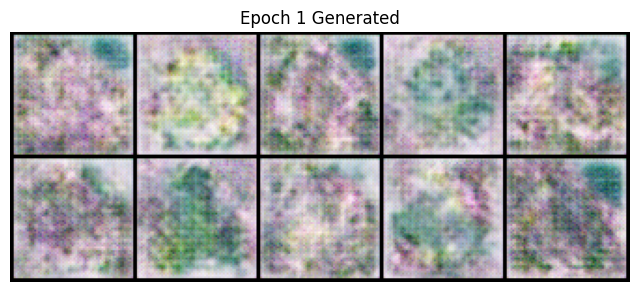

Epoch 2/50 | D Loss: 0.4571 | G Loss: 4.3371


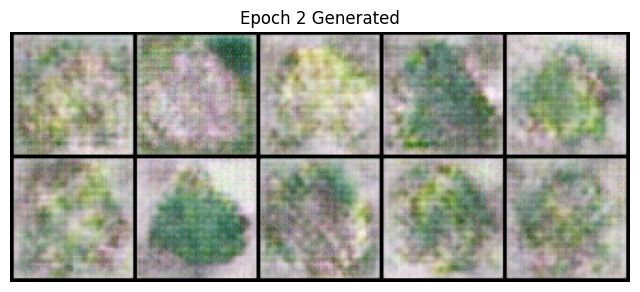

Epoch 3/50 | D Loss: 0.2720 | G Loss: 2.9334


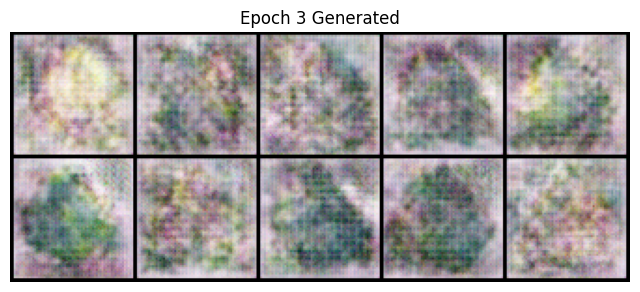

Epoch 4/50 | D Loss: 0.9490 | G Loss: 1.8175


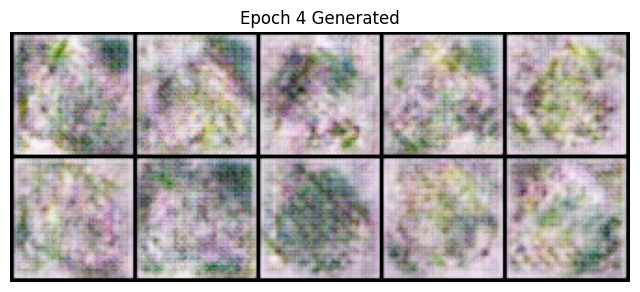

Epoch 5/50 | D Loss: 0.2449 | G Loss: 3.3969


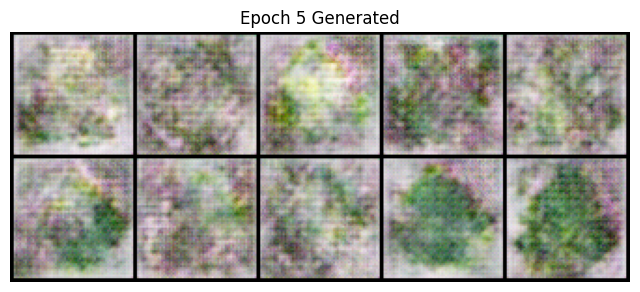

Epoch 6/50 | D Loss: 0.3461 | G Loss: 2.2059


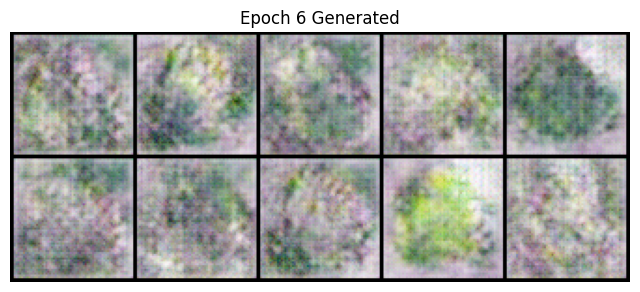

Epoch 7/50 | D Loss: 0.3499 | G Loss: 2.5535


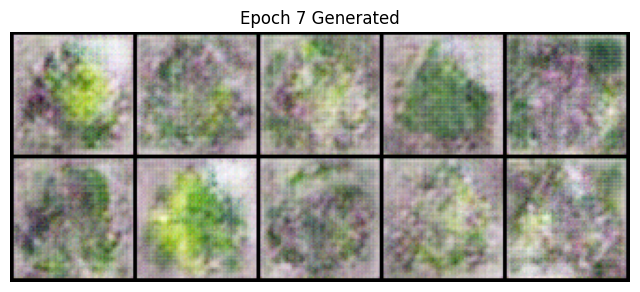

Epoch 8/50 | D Loss: 0.4099 | G Loss: 2.9472


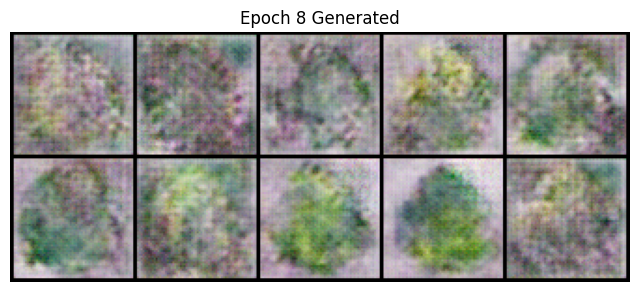

Epoch 9/50 | D Loss: 0.1778 | G Loss: 3.5997


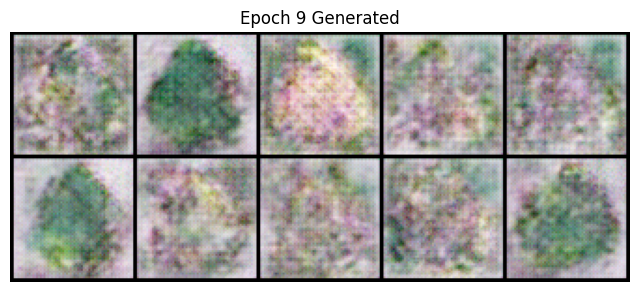

Epoch 10/50 | D Loss: 0.5431 | G Loss: 2.4260


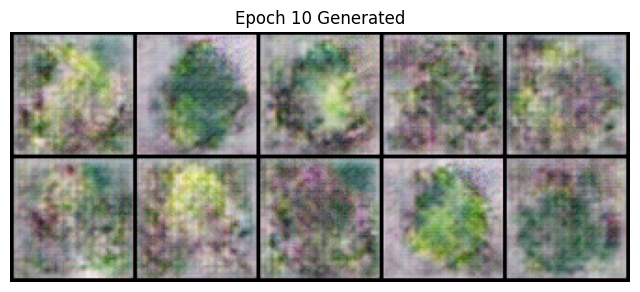

Epoch 11/50 | D Loss: 0.4316 | G Loss: 2.1182


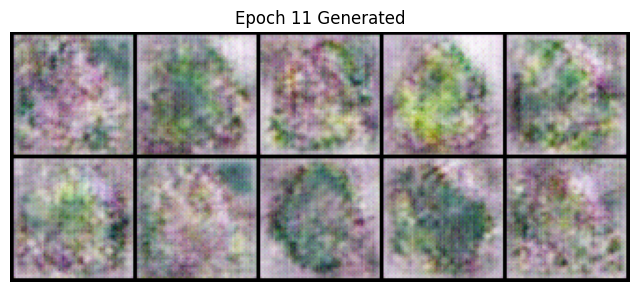

Epoch 12/50 | D Loss: 0.1825 | G Loss: 3.0062


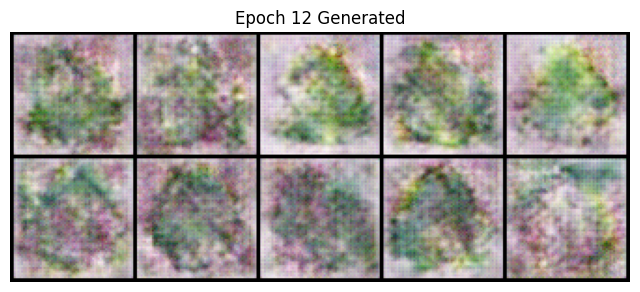

Epoch 13/50 | D Loss: 0.6221 | G Loss: 2.0965


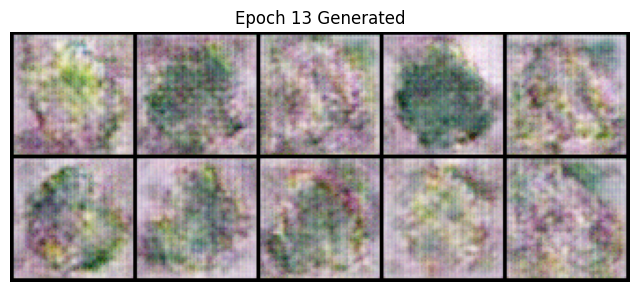

Epoch 14/50 | D Loss: 0.6747 | G Loss: 1.7340


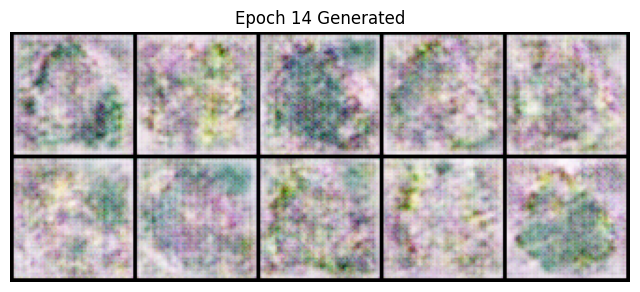

Epoch 15/50 | D Loss: 0.2939 | G Loss: 1.9973


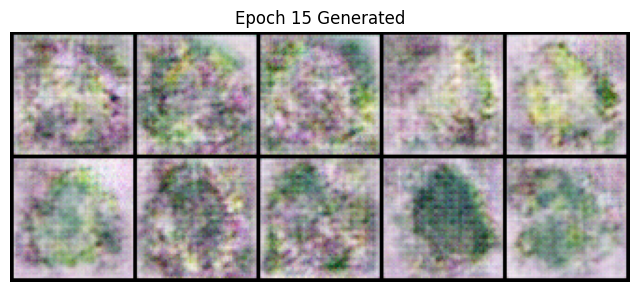

Epoch 16/50 | D Loss: 0.2919 | G Loss: 2.4601


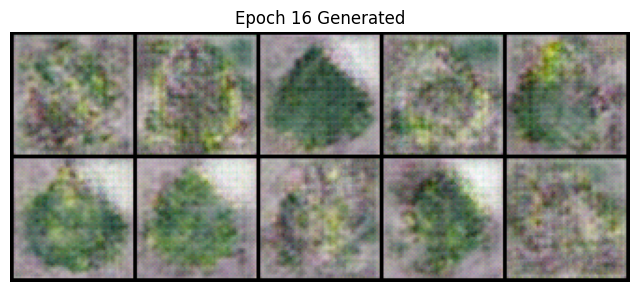

Epoch 17/50 | D Loss: 1.0201 | G Loss: 2.0667


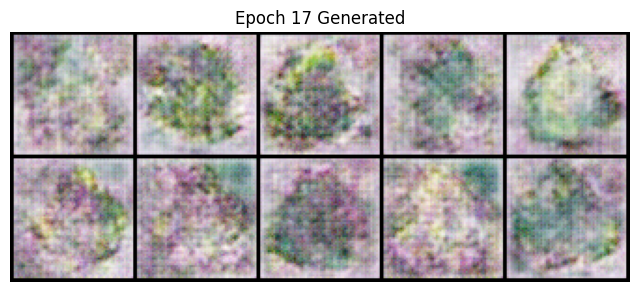

Epoch 18/50 | D Loss: 0.4076 | G Loss: 1.7490


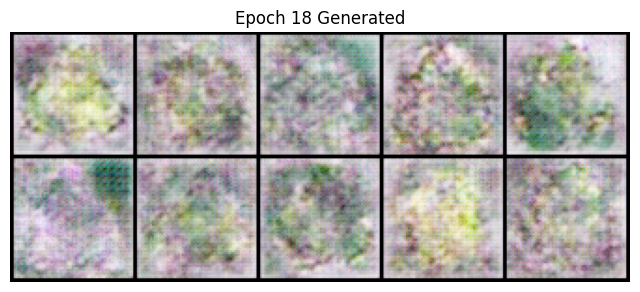

Epoch 19/50 | D Loss: 0.8257 | G Loss: 3.0626


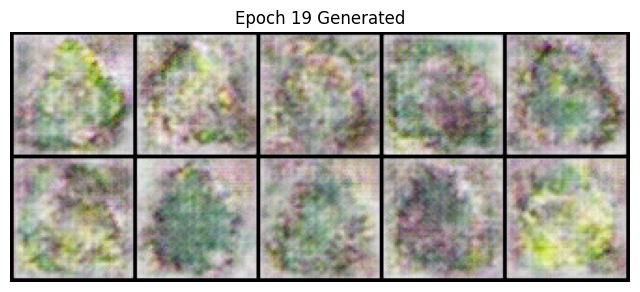

Epoch 20/50 | D Loss: 0.4896 | G Loss: 2.2430


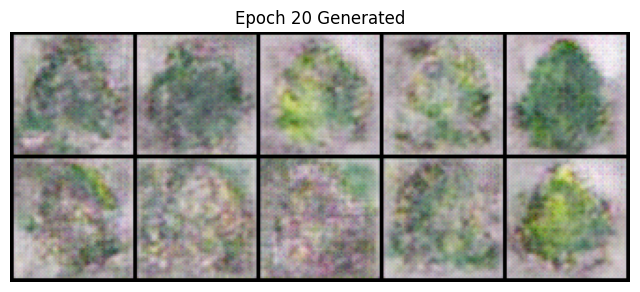

Epoch 21/50 | D Loss: 0.3750 | G Loss: 2.3250


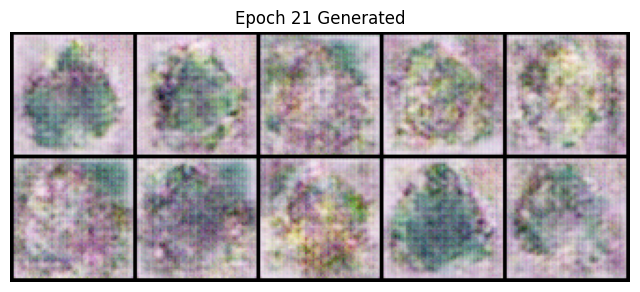

Epoch 22/50 | D Loss: 0.2545 | G Loss: 2.3841


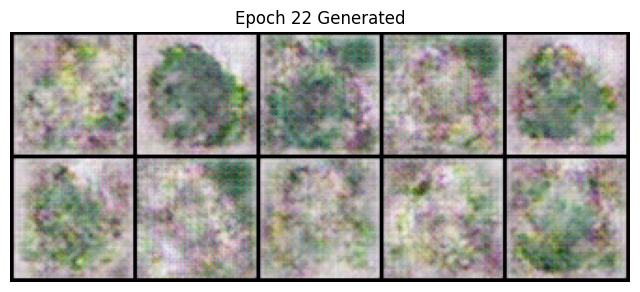

Epoch 23/50 | D Loss: 0.2731 | G Loss: 2.8216


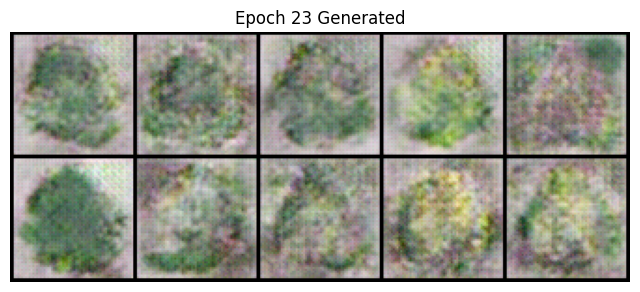

Epoch 24/50 | D Loss: 0.8205 | G Loss: 1.7369


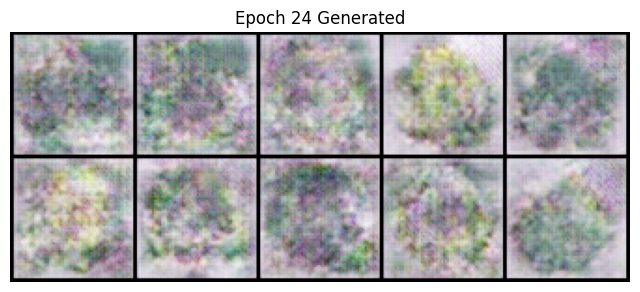

Epoch 25/50 | D Loss: 0.4432 | G Loss: 2.8454


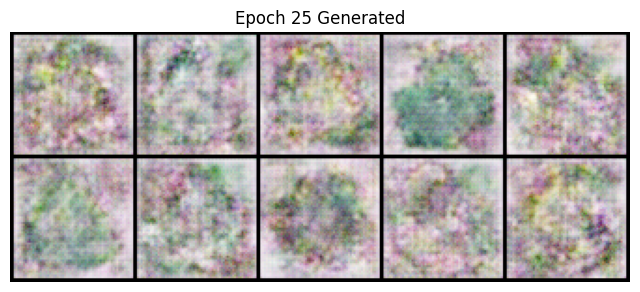

Epoch 26/50 | D Loss: 0.1757 | G Loss: 2.9228


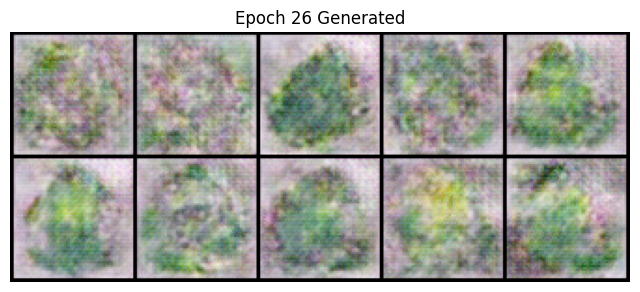

Epoch 27/50 | D Loss: 0.3139 | G Loss: 2.3629


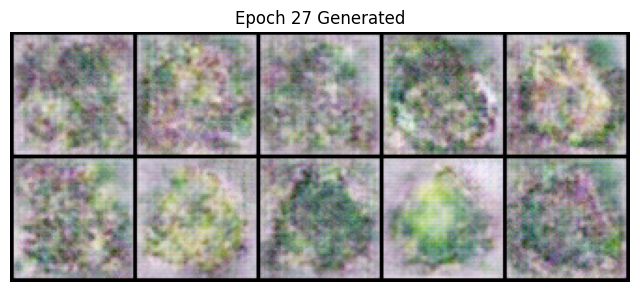

Epoch 28/50 | D Loss: 0.5205 | G Loss: 3.9546


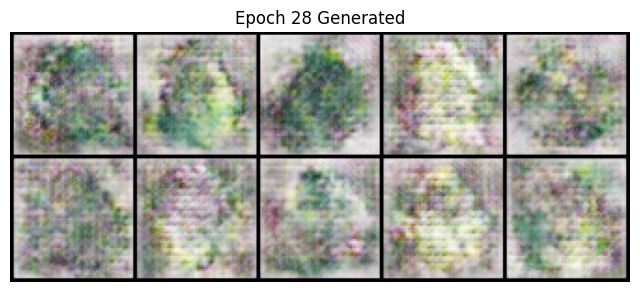

Epoch 29/50 | D Loss: 0.3494 | G Loss: 2.8457


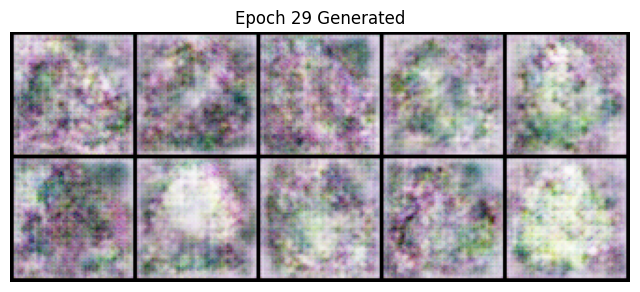

Epoch 30/50 | D Loss: 0.3241 | G Loss: 3.2152


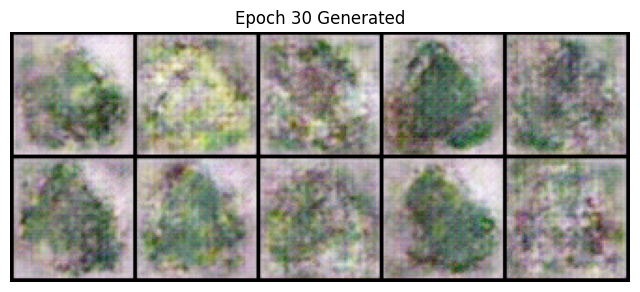

Epoch 31/50 | D Loss: 0.5727 | G Loss: 2.5467


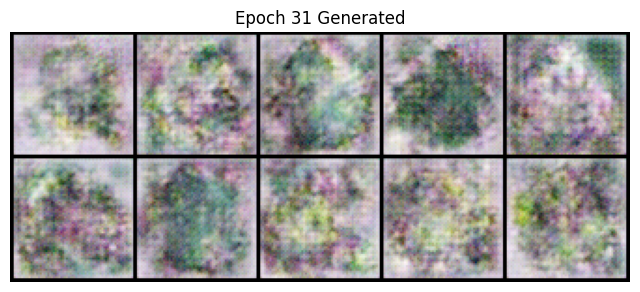

Epoch 32/50 | D Loss: 0.6597 | G Loss: 2.9496


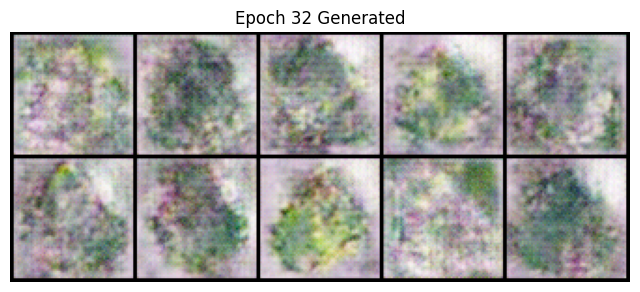

Epoch 33/50 | D Loss: 0.3612 | G Loss: 1.9379


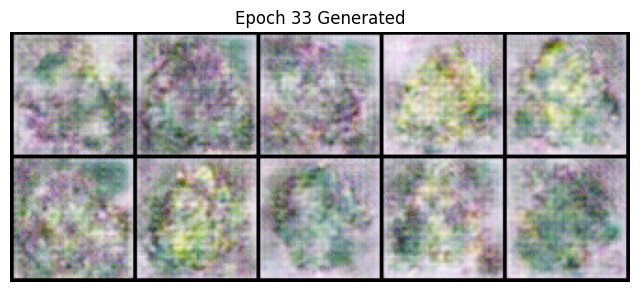

Epoch 34/50 | D Loss: 0.3984 | G Loss: 2.3380


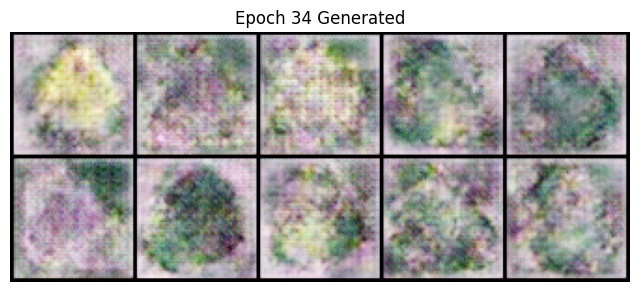

Epoch 35/50 | D Loss: 0.3751 | G Loss: 2.5236


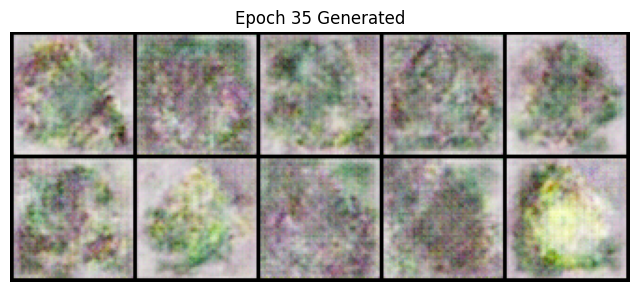

Epoch 36/50 | D Loss: 0.4971 | G Loss: 3.1966


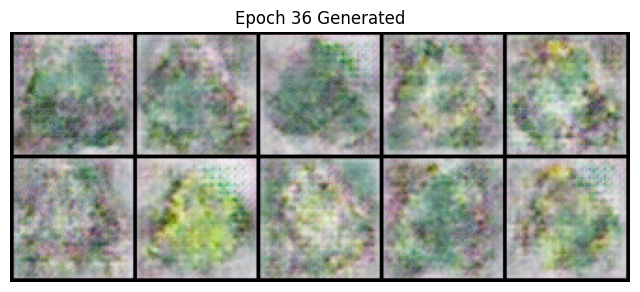

Epoch 37/50 | D Loss: 0.1476 | G Loss: 3.4861


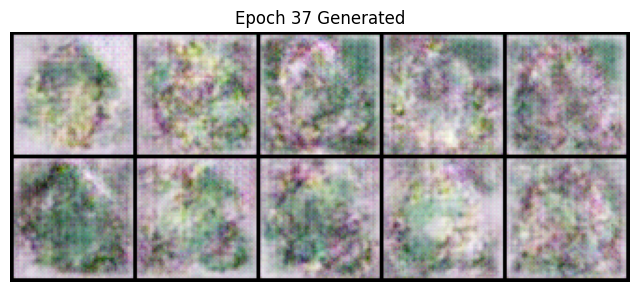

Epoch 38/50 | D Loss: 0.2591 | G Loss: 2.8381


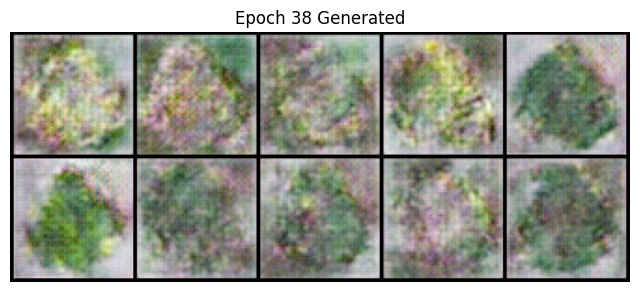

Epoch 39/50 | D Loss: 0.3536 | G Loss: 3.1978


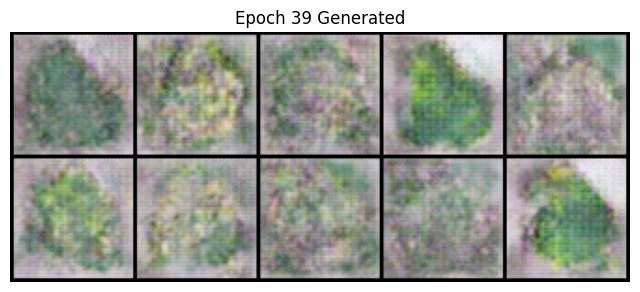

Epoch 40/50 | D Loss: 0.5789 | G Loss: 2.9371


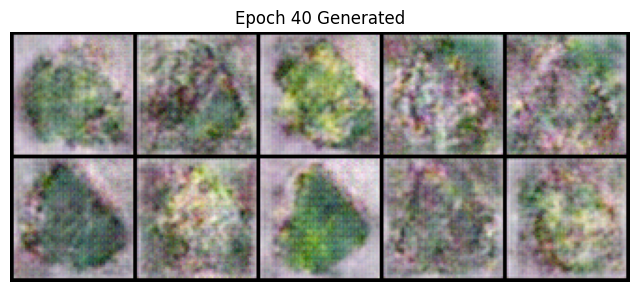

Epoch 41/50 | D Loss: 0.5922 | G Loss: 1.5981


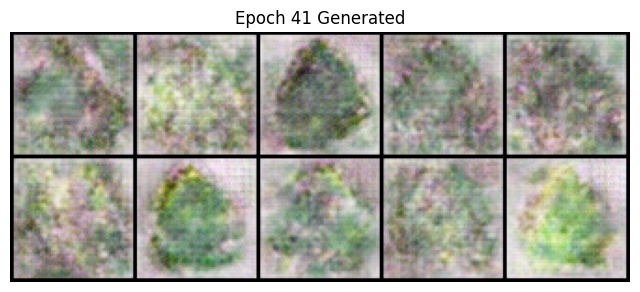

Epoch 42/50 | D Loss: 0.6758 | G Loss: 3.2260


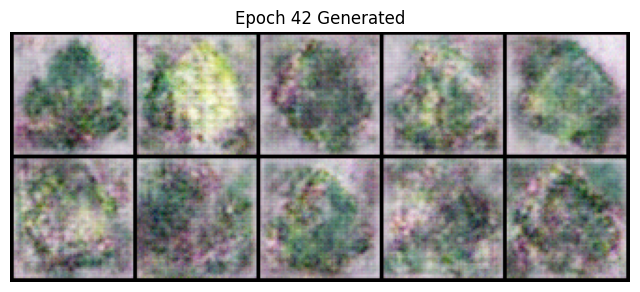

Epoch 43/50 | D Loss: 0.4276 | G Loss: 4.1374


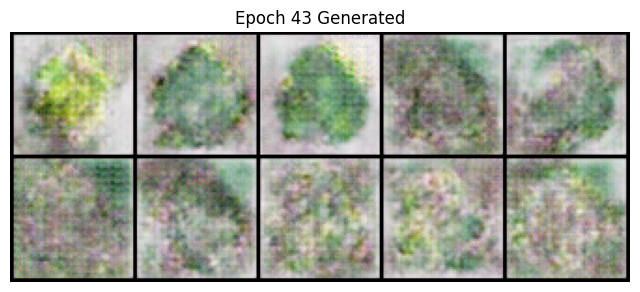

Epoch 44/50 | D Loss: 0.5044 | G Loss: 2.1136


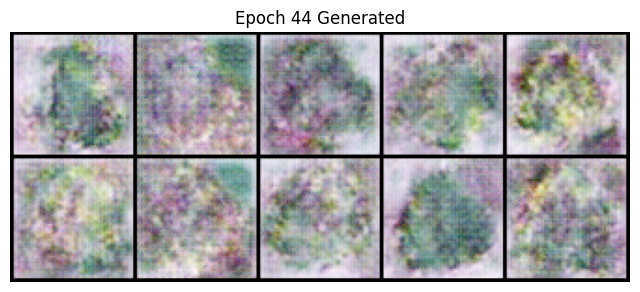

Epoch 45/50 | D Loss: 0.2070 | G Loss: 3.5598


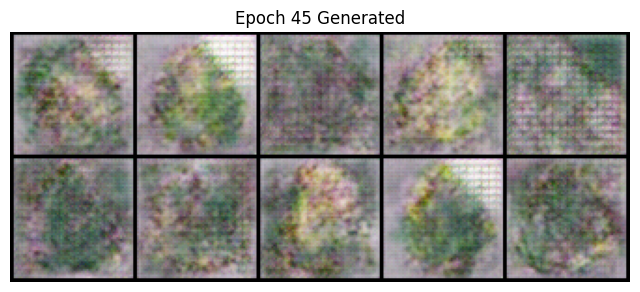

Epoch 46/50 | D Loss: 0.3058 | G Loss: 2.4571


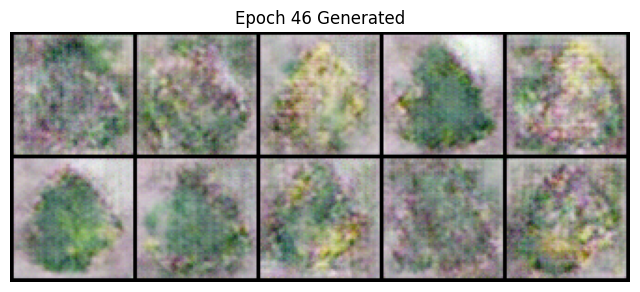

Epoch 47/50 | D Loss: 0.2195 | G Loss: 2.4146


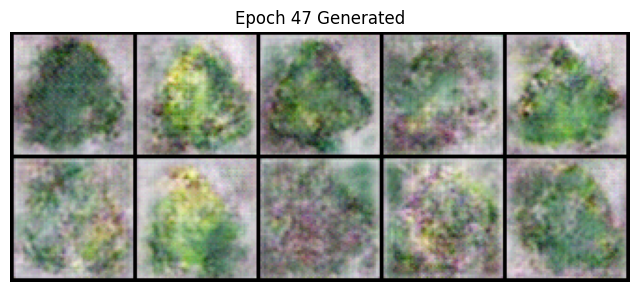

Epoch 48/50 | D Loss: 0.4310 | G Loss: 2.9539


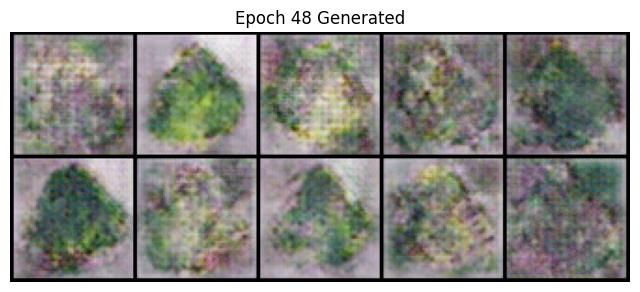

Epoch 49/50 | D Loss: 0.2004 | G Loss: 2.7090


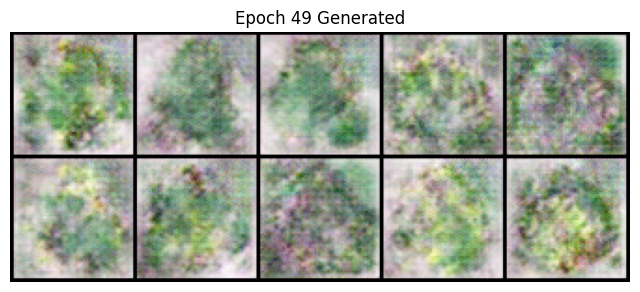

Epoch 50/50 | D Loss: 0.2840 | G Loss: 3.7872


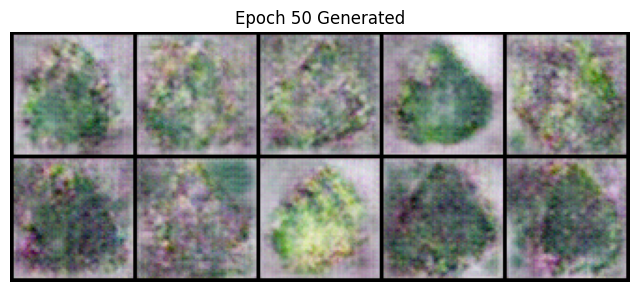


✅ Training completed in 191.38 seconds.


In [ ]:
# Step 7: Training Loop
def train(num_epochs=120):
    start = time.time()
    for epoch in range(num_epochs):
        for batch in dataloader:
            real_imgs = batch.to(device)
            batch_size = real_imgs.size(0)
            valid = torch.ones(batch_size, 1, device=device)
            fake = torch.zeros(batch_size, 1, device=device)

            # === Train Encoder + Decoder ===
            optimizer_G.zero_grad()
            optimizer_E.zero_grad()

            mu, logvar = encoder(real_imgs)
            z = reparameterize(mu, logvar)
            recon_imgs = decoder(z)
            pred_fake = discriminator(recon_imgs)

            kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
            recon_loss = mse_loss(recon_imgs, real_imgs)
            adv_loss = bce_loss(pred_fake, valid)
            g_loss = recon_loss + kld + adv_loss

            g_loss.backward()
            optimizer_G.step()
            optimizer_E.step()

            # === Train Discriminator ===
            optimizer_D.zero_grad()
            pred_real = discriminator(real_imgs)
            loss_real = bce_loss(pred_real, valid)

            pred_fake = discriminator(recon_imgs.detach())
            loss_fake = bce_loss(pred_fake, fake)

            d_loss = 0.5 * (loss_real + loss_fake)
            d_loss.backward()
            optimizer_D.step()

        print(f"Epoch {epoch+1}/{num_epochs} | D Loss: {d_loss.item():.4f} | G Loss: {g_loss.item():.4f}")

        # Show generated images
        with torch.no_grad():
            z = torch.randn(10, latent_dim).to(device)
            gen_imgs = decoder(z)
            grid = utils.make_grid(gen_imgs.cpu(), nrow=5, normalize=True)
            plt.figure(figsize=(8, 4))
            plt.imshow(grid.permute(1, 2, 0))
            plt.title(f"Epoch {epoch+1} Generated")
            plt.axis('off')
            plt.show()

    end = time.time()
    print(f"\n✅ Training completed in {end - start:.2f} seconds.")

train(num_epochs=50)

In [ ]:
# Step 8: Save 50 Synthetic Images
os.makedirs("synthetic_outputs", exist_ok=True)
decoder.eval()
with torch.no_grad():
    z = torch.randn(50, latent_dim).to(device)
    synthetic_images = decoder(z).cpu()
    for idx, img in enumerate(synthetic_images):
        utils.save_image(img, f"synthetic_outputs/synthetic_{idx+1}.png", normalize=True)
print("✅ 50 synthetic images saved in 'synthetic_outputs' folder.")

✅ 50 synthetic images saved in 'synthetic_outputs' folder.
